In [1]:
import os
import sys
import yaml
import matplotlib.pyplot as plt
import numpy as np
import torch
import random
import glob
import rasterio
from PIL import Image
from matplotlib.colors import ListedColormap

In [2]:
if os.getcwd().endswith('notebooks'):
    os.chdir('..')
sys.path.append(os.getcwd())

In [3]:
from src.experiments.train_unet import SegmentationExperiment
from src.utils.rasterize import rasterize_spacenet8

In [4]:
with open("config.yaml", "r") as f:
        config = yaml.safe_load(f)

In [5]:
config["segmentation"]["data"]["train_dir"]

'data/SpaceNet8/Louisiana-East_Training_Public'

In [6]:
BASE_DIR = config["segmentation"]["data"]["train_dir"]

In [7]:
config["segmentation"]["data"]

{'train_dir': 'data/SpaceNet8/Louisiana-East_Training_Public',
 'train_mapping': 'data/SpaceNet8/Louisiana-East_Training_Public/Louisiana-East_Training_Public_label_image_mapping.csv',
 'train_masks': 'data/SpaceNet8/Louisiana-East_Training_Public/masks_multiclass',
 'train_img_dir': 'data/SpaceNet8/Louisiana-East_Training_Public/PRE-event',
 'train_annotations_dir': 'data/SpaceNet8/Louisiana-East_Training_Public/annotations',
 'test_dir': 'data/SpaceNet8/Louisiana-West_Test_Publics',
 'test_mapping': 'data/SpaceNet8/Louisiana-West_Test_Public/Louisiana-West_Test_Public_label_image_mapping.csv',
 'test_masks': 'data/SpaceNet8/Louisiana-West_Test_Public/masks_multiclass',
 'test_img_dir': 'data/SpaceNet8/Louisiana-West_Test_Publics/PRE-event',
 'mask_dir': 'data/SpaceNet8/Louisiana-East_Training_Public/masks_generated'}

In [8]:
rasterize_spacenet8(
    csv_path=config["segmentation"]["data"]["train_mapping"],
    output_mask_dir=config["segmentation"]["data"]["train_masks"],
    img_dir=config["segmentation"]["data"]["train_img_dir"],
    annotations_dir=config["segmentation"]["data"]["train_annotations_dir"]
)

Rasterizing: 100%|██████████| 599/599 [00:23<00:00, 25.14it/s]

Success: Masks saved in data/SpaceNet8/Louisiana-East_Training_Public/masks_multiclass.


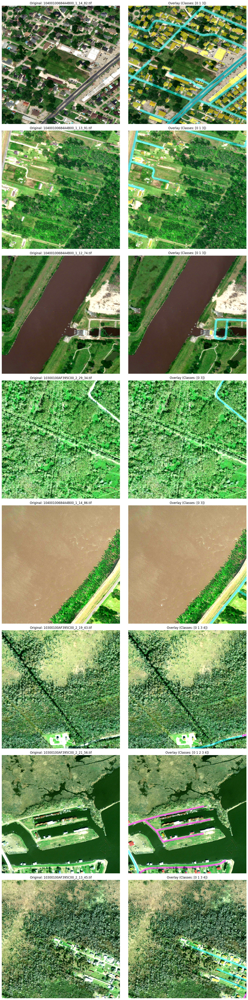

In [9]:
def debug_overlay_grid(mask_dir, img_dir, num_samples=4):
    all_masks = glob.glob(os.path.join(mask_dir, "*.png"))
    samples = random.sample(all_masks, min(num_samples, len(all_masks)))
    
    fig, axes = plt.subplots(num_samples, 2, figsize=(15, 7 * num_samples))
    
    # 0: transparent, 1: Jaune (Bat), 2: Rouge (Bat inondé), 3: Cyan (Route), 4: Magenta (Route inondée)
    colors = ['black', 'yellow', 'red', 'cyan', 'magenta']
    cmap = ListedColormap(colors)

    for i, mask_path in enumerate(samples):
        # Match the image
        img_name = os.path.basename(mask_path).replace('_mask.png', '.tif')
        img_path = os.path.join(img_dir, img_name)
        
        if not os.path.exists(img_path):
            print(f"Image manquante : {img_path}")
            continue

        # Read .tif image
        with rasterio.open(img_path) as src:
            img = src.read([1, 2, 3]).transpose(1, 2, 0)
            # We remove extreme percentile to lighten the image
            p2, p98 = np.percentile(img, (2, 98))
            img = np.clip((img - p2) / (p98 - p2), 0, 1)
        
        # Mask
        mask = np.array(Image.open(mask_path))
        
        # Original Image
        axes[i, 0].imshow(img)
        axes[i, 0].set_title(f"Original: {img_name}")
        axes[i, 0].axis('off')
        
        # Overlay
        axes[i, 1].imshow(img)
        
        mask_overlay = np.ma.masked_where(mask == 0, mask)
        axes[i, 1].imshow(mask_overlay, cmap=cmap, alpha=0.5, vmin=0, vmax=4)
        axes[i, 1].set_title(f"Overlay (Classes: {np.unique(mask)})")
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

MASK_DIR = "data/SpaceNet8/Louisiana-East_Training_Public/masks_multiclass"
IMG_DIR = "data/SpaceNet8/Louisiana-East_Training_Public/PRE-event"

debug_overlay_grid(MASK_DIR, IMG_DIR, num_samples=8)

In [10]:
exp = SegmentationExperiment(config_path="config.yaml")

In [11]:
exp.run()

--- Starting Segmentation Training on cpu ---


Epoch 1:   0%|          | 0/96 [00:00<?, ?batch/s]


[DEBUG] Epoch 1 - Premier Batch:
   -> Images shape: torch.Size([5, 3, 256, 256])
   -> Masks shape:  torch.Size([5, 256, 256])


Epoch 1: 100%|██████████| 96/96 [08:54<00:00,  5.56s/batch, loss=1.79]



[Validation] Loss: 1.7172 | Acc: 0.2484 | Prec: 0.3291 | F1: 0.2652
Epoch 1: Train Loss: 2.0572 | Val Loss: 1.7172 | Val F1: 0.2652
Best Model Saved (Loss: 1.7172, F1: 0.2652)


Epoch 2:   0%|          | 0/96 [00:00<?, ?batch/s]


[DEBUG] Epoch 2 - Premier Batch:
   -> Images shape: torch.Size([5, 3, 256, 256])
   -> Masks shape:  torch.Size([5, 256, 256])


Epoch 2: 100%|██████████| 96/96 [52:38<00:00, 32.90s/batch, loss=1.51]    



[Validation] Loss: 1.4862 | Acc: 0.2716 | Prec: 0.3490 | F1: 0.2933
Epoch 2: Train Loss: 1.6242 | Val Loss: 1.4862 | Val F1: 0.2933
Best Model Saved (Loss: 1.4862, F1: 0.2933)


Epoch 3:   0%|          | 0/96 [00:00<?, ?batch/s]


[DEBUG] Epoch 3 - Premier Batch:
   -> Images shape: torch.Size([5, 3, 256, 256])
   -> Masks shape:  torch.Size([5, 256, 256])


Epoch 3: 100%|██████████| 96/96 [21:50<00:00, 13.65s/batch, loss=1.34] 



[Validation] Loss: 1.4098 | Acc: 0.2630 | Prec: 0.3884 | F1: 0.2712
Epoch 3: Train Loss: 1.4361 | Val Loss: 1.4098 | Val F1: 0.2712


Epoch 4:   0%|          | 0/96 [00:00<?, ?batch/s]


[DEBUG] Epoch 4 - Premier Batch:
   -> Images shape: torch.Size([5, 3, 256, 256])
   -> Masks shape:  torch.Size([5, 256, 256])


Epoch 4: 100%|██████████| 96/96 [2:11:43<00:00, 82.33s/batch, loss=1.34]     



[Validation] Loss: 1.2615 | Acc: 0.3151 | Prec: 0.4006 | F1: 0.3445
Epoch 4: Train Loss: 1.3016 | Val Loss: 1.2615 | Val F1: 0.3445
Best Model Saved (Loss: 1.2615, F1: 0.3445)


Epoch 5:   0%|          | 0/96 [00:00<?, ?batch/s]


[DEBUG] Epoch 5 - Premier Batch:
   -> Images shape: torch.Size([5, 3, 256, 256])
   -> Masks shape:  torch.Size([5, 256, 256])


Epoch 5: 100%|██████████| 96/96 [17:39:40<00:00, 662.30s/batch, loss=1.08]      



[Validation] Loss: 1.1906 | Acc: 0.3045 | Prec: 0.4270 | F1: 0.3333
Epoch 5: Train Loss: 1.1984 | Val Loss: 1.1906 | Val F1: 0.3333


Epoch 6:   0%|          | 0/96 [00:00<?, ?batch/s]


[DEBUG] Epoch 6 - Premier Batch:
   -> Images shape: torch.Size([5, 3, 256, 256])
   -> Masks shape:  torch.Size([5, 256, 256])


Epoch 6: 100%|██████████| 96/96 [18:40<00:00, 11.67s/batch, loss=1.12] 



[Validation] Loss: 1.0677 | Acc: 0.3666 | Prec: 0.4466 | F1: 0.3904
Epoch 6: Train Loss: 1.1117 | Val Loss: 1.0677 | Val F1: 0.3904
Best Model Saved (Loss: 1.0677, F1: 0.3904)


Epoch 7:   0%|          | 0/96 [00:00<?, ?batch/s]


[DEBUG] Epoch 7 - Premier Batch:
   -> Images shape: torch.Size([5, 3, 256, 256])
   -> Masks shape:  torch.Size([5, 256, 256])


Epoch 7: 100%|██████████| 96/96 [31:43<00:00, 19.83s/batch, loss=0.998]   



[Validation] Loss: 1.0212 | Acc: 0.3443 | Prec: 0.4687 | F1: 0.3847
Epoch 7: Train Loss: 1.0532 | Val Loss: 1.0212 | Val F1: 0.3847


Epoch 8:   0%|          | 0/96 [00:00<?, ?batch/s]


[DEBUG] Epoch 8 - Premier Batch:
   -> Images shape: torch.Size([5, 3, 256, 256])
   -> Masks shape:  torch.Size([5, 256, 256])


Epoch 8: 100%|██████████| 96/96 [10:29<00:00,  6.56s/batch, loss=0.95] 



[Validation] Loss: 0.9513 | Acc: 0.4546 | Prec: 0.4527 | F1: 0.4351
Epoch 8: Train Loss: 0.9961 | Val Loss: 0.9513 | Val F1: 0.4351
Best Model Saved (Loss: 0.9513, F1: 0.4351)


Epoch 9:   0%|          | 0/96 [00:00<?, ?batch/s]


[DEBUG] Epoch 9 - Premier Batch:
   -> Images shape: torch.Size([5, 3, 256, 256])
   -> Masks shape:  torch.Size([5, 256, 256])


Epoch 9: 100%|██████████| 96/96 [18:36<00:00, 11.63s/batch, loss=0.93]    



[Validation] Loss: 0.9892 | Acc: 0.3465 | Prec: 0.3884 | F1: 0.3632
Epoch 9: Train Loss: 0.9556 | Val Loss: 0.9892 | Val F1: 0.3632


Epoch 10:   0%|          | 0/96 [00:00<?, ?batch/s]


[DEBUG] Epoch 10 - Premier Batch:
   -> Images shape: torch.Size([5, 3, 256, 256])
   -> Masks shape:  torch.Size([5, 256, 256])


Epoch 10: 100%|██████████| 96/96 [14:53<00:00,  9.30s/batch, loss=0.912]



[Validation] Loss: 0.8963 | Acc: 0.4311 | Prec: 0.4436 | F1: 0.4366
Epoch 10: Train Loss: 0.9220 | Val Loss: 0.8963 | Val F1: 0.4366
Best Model Saved (Loss: 0.8963, F1: 0.4366)


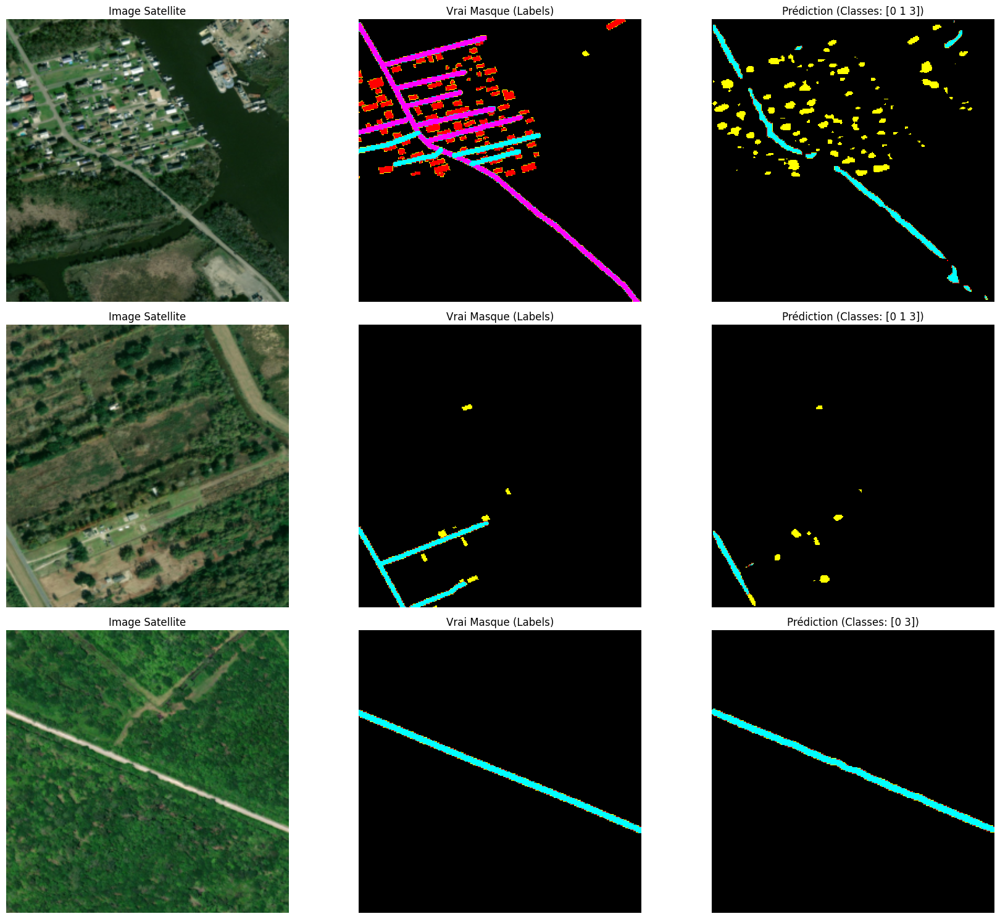

In [13]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap

def visualize_results(experiment, num_samples=3):
    experiment.model.eval()
    # On récupère le val_loader via prepare_data
    _, val_loader = experiment.prepare_data()
    
    # Couleurs flashy pour bien voir les classes
    # 0: Fond, 1: Bâtiment, 2: Bât. Inondé, 3: Route, 4: Route Inondée
    colors = ['black', 'yellow', 'red', 'cyan', 'magenta']
    cmap = ListedColormap(colors)
    
    # On prend un batch
    images, masks = next(iter(val_loader))
    images = images.to(experiment.device)
    
    with torch.no_grad():
        outputs = experiment.model(images)
        preds = torch.argmax(outputs, dim=1)
    
    fig, axes = plt.subplots(num_samples, 3, figsize=(18, 5 * num_samples))
    
    for i in range(min(num_samples, len(images))):
        # Image originale (on dé-normalise pour l'affichage)
        img_display = images[i].cpu().permute(1, 2, 0).numpy()
        img_display = (img_display - img_display.min()) / (img_display.max() - img_display.min() + 1e-8)
        
        # Ground Truth (Vérité terrain)
        gt = masks[i].cpu().numpy()
        
        # Prediction
        pred = preds[i].cpu().numpy()
        
        axes[i, 0].imshow(img_display)
        axes[i, 0].set_title("Image Satellite")
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(gt, cmap=cmap, vmin=0, vmax=4)
        axes[i, 1].set_title("Vrai Masque (Labels)")
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(pred, cmap=cmap, vmin=0, vmax=4)
        axes[i, 2].set_title(f"Prédiction (Classes: {np.unique(pred)})")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

visualize_results(exp)